# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
# !pip install -q ydata_profiling
# !pip install --upgrade ydata-profiling scipy numpy pandas
# !pip install -q ipywidgets

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction import FeatureHasher
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_squared_error as MSE
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re
from ydata_profiling import ProfileReport
import pickle

%matplotlib inline

random.seed(42)
np.random.seed(42)

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Установка seed-a - это фиксирование псевдослучайности. Так как многие алгоритмы, особенно в ML имаеют стохастический (случайный) результат, например train_test_split (разделение выборки на трейн и тест), подбор гиперпараметров и т.д. был придуман механизм установки псевдослучайного поведения. Мы как бы разрешаем такой стохастический процесс в алгоритмах но фиксируем его состояние, чтобы всегда иметь возможность его воспроизвести и получить тот же результат. Без этого механизма мы бы всегда получали чуть разные результаты при работе таких алгоритмов.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

In [3]:
# вывод 30 случайных строк тренировочного датасета
df_train.sample(30)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
# вывод первых 5 объектов тестового датасета
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [5]:
# вывод последних 5 объектов тестового датасета
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [6]:
# выведем кол-во и процент пропусков по каждой колонке
def print_missing_values(df, cols_w_miss=True):
    '''Функция для вывода информации о проупсках в pandas dataframe.
       Параметр cols_w_miss по умолчанию установлен в True и 
       отвечает за вывод информации только по тем колонкам, в
       которых есть пропуски.
    '''
    
    missing_res = pd.concat(
                      [df.isna().sum(), (df.isna().sum() / len(df) * 100).round(2)],
                      axis=1, 
                      keys=['count', 'percent'],
                      join='inner'
                  )
    res = missing_res[missing_res['count'] != 0] if cols_w_miss else missing_res
    if not res.empty:
        print(res)
        return res.index.to_list()
    else:
        print('В данных пропусков не обнаружено!')


df_for_analys = {'df_train': df_train, 'df_test': df_test}

for df_name, df in df_for_analys.items():
    print(df_name)
    missing_cols = print_missing_values(df)
    print('-'*50)

df_train
           count  percent
mileage      202     2.89
engine       202     2.89
max_power    196     2.80
torque       203     2.90
seats        202     2.89
--------------------------------------------------
df_test
           count  percent
mileage       19      1.9
engine        19      1.9
max_power     19      1.9
torque        19      1.9
seats         19      1.9
--------------------------------------------------


По колонкам mileage, engine, max_power, torque, seats и в трейн и тест выборке есть незначительные пропуски от 1.9 до 2.9%.

In [7]:
# проверим есть ли в данных явные дубликаты
for df_name, df in df_for_analys.items():
    print(df_name)
    print('Количество явных дубликатов:', df.duplicated().sum())
    print('-'*50)

df_train
Количество явных дубликатов: 985
--------------------------------------------------
df_test
Количество явных дубликатов: 62
--------------------------------------------------


В трейн выборке очень много явных дубликатов: 985 из 6999 записей. В тест выборке явных дубликатов не так много: 62 записи из 1000. Все явные дубликаты в дальнейшем будут удалены.

### Ответы на вопросы:
1) По первым, последним или случайным строкам из датасета мы можем только посмотреть в целом на представленные данные (какие есть колонки, какие значения в признаках и т.д.). Но мы не можем оценить количество пропусков, дубликатов (явных или не явных), количество уникальных значений категориальных признаков и т.д.
2) Использование метода duplicated не достаточно для проверик датасета на дубликаты, т.к. в нем могут быть не явные дубликаты. Например в выборке могут быть другие скрытые дубликаты:
   - Например такие дубликаты могут быть отловлены после предобработки текстовых признаков `mileage`, `engine`, `torque`, `max_power` и перевода их к числовому типу;
   - Дубликаты могут быть если убрать из датасета целевую переменную;
   - Более сложный случай - незначительно различие по колокне `name`. Несколько записей могут быть дубликатами, но из-за ошибки например в названии автомобиля, могут быть не распознаны. Чтобы выявить такие дубликаты можно попробовать, посмотреть на возможные дубликаты без этой колонки и потом в найденных дубликатах проверить названия по колонке `name`;
   - Так же скрытые дубликаты возможны по колонке `year`. Например один и тот же автомобиль, возможно и два разных, имеют одинаковое признаковое описание но разную дату выпуска. 

In [8]:
ProfileReport(df_train, title='Pandas Profiling Report for train')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 54.53it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Обшие выводы для трейн-выборки:
1) В данных всего 13 признаков, из них 4 признака это текстовый тип данных, 5 - числовой тип и 4 - категориальный;
2) Есть пропуски в данных, это 1005 пропущенных значения или 1,1% от всех значений;
3) Есть 493 уникальных явных дубликата или 7% от всех данных;
4) По колонке `seller_type` очень сильный диcбаланс классов (возможных значений). Из 3-х уникальных значений 5826 записей из 6999 имеют значение **Individual**;
5) По колонке `transmission` очень сильный диcбаланс классов (возможных значений). Из 2-х уникальных значений 6095 записей из 6999 имеют значение **Manual**;
6) По колонке `owner` сильный диcбаланс классов (возможных значений). Из 5-и уникальных значений 4587 записей из 6999 имеют значение **Fist Owner**;
7) В данной выборке представлена информация о стоимости автомобилей от 1983 до 2020 года выпуска;
8) По целевой колонке стоимости `selling price` есть 16 записей об автомобилях с экстремально высокой стоимостью от 580 000 y.e. и выше вплоть до 10 000 000 y.e;
9) По колонке `km_driven` (скорее всего обозначает пробег) есть 2 записи об автомобилях с экстремально высоким пробегом: 1 500 000 km и 2 360 457 km. Возможно это ошибка;
10) По колонке `max_power` есть 7 записей об автомобилях с нулевым значением мощности двигателя. Возможно это ошибка и стоит попробовать восстановить значения по модели и типу автомобиля;
11) Колонка `engine` (скорее всего обозначает объем двигателя) имеет текстовый тип, но содержит значимый числовой признак. Требует приведения к числовому типу;
12) Колонка `torque` (скорее всего обозначает создаваемый крутящий момент двигателем автомобиля) имеет текстовый тип, но содержит значимые числовые признаки. Требует доп. обработки для преобразования к числовому типу (возможен фич-инжиниринг);
13) Колонка `mileage` (скорее всего обозначает расход топлива) имеет текстовый тип, но содержит значимый числовой признак. Требует приведения к числовому типу;
14) Есть сильная прямая корреляция между следующими колонками (признаками): `max_power` и `fuel`, `seller_type` и `max_power`, `selling_price` и `max_power`, `transmission` и `max_power`, `transmission` и `selling_price`, `year` и `selling_price`;
15) Есть сильная обратная корреляция между следующими колонками (признаками): `km_driven` и `selling_price`, `km_driven` и `year`.

In [9]:
ProfileReport(df_test, title='Pandas Profiling Report for test')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 79.35it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Обшие выводы для тест-выборки:
1) В данных так же всего 13 признаков, из них 5 признаков это текстовый тип данных, 4 - числовой тип и 4 - категориальный. Важно привести все типы в соотв-ие с train-выборкой!;
2) Есть пропуски в данных, это 95 пропущенных значения или 0,7% от всех значений;
3) Есть 33 уникальных явных дубликата или 3,3% от всех данных;
4) По колонке `seller_type` очень сильный диcбаланс классов (возможных значений). Из 3-х уникальных значений 837 записей из 1000 имеют значение **Individual**;
5) По колонке `transmission` очень сильный диcбаланс классов (возможных значений). Из 2-х уникальных значений 877 записей из 1000 имеют значение **Manual**;
6) В данной выборке представлена информация о стоимости автомобилей от 1995 до 2020 года выпуска. Нижняя граница отличается от трейн-выборки (но это в пределах нормы отличий);
7) По целевой колонке стоимости `selling price` есть 26 записей об автомобилях с экстремально высокой стоимостью от 3 200 000 y.e. и выше вплоть до 6 000 000 y.e. Уже видим что в тестовой выьорке намного больше автомобилей с высокой ценой;
8) Колонка `max_power` в отличие от трейн-выборки имеет текстовый тип и обязательно должна быть преобразована в числовой!;
9) Колонка `engine` (скорее всего обозначает объем двигателя) имеет текстовый тип, но содержит значимый числовой признак. Требует приведения к числовому типу;
10) Колонка `torque` (скорее всего обозначает создаваемый крутящий момент двигателем автомобиля) имеет текстовый тип, но содержит значимые числовые признаки. Требует доп. обработки для преобразования к числовому типу (возможен фич-инжиниринг);
11) Колонка `mileage` (скорее всего обозначает расход топлива) имеет текстовый тип, но содержит значимый числовой признак. Требует приведения к числовому типу;
12) Есть сильная прямая корреляция между следующими колонками (признаками):`transmission` и `selling_price`, `year` и `selling_price`, Видим что в тестовой выборке нет такой сидьной прямой корреляции по многим признакам как в трейн-выборке (не забываем что признак `max_power` здесь имеет текстовый тип);
13) Есть сильная обратная корреляция между следующими колонками (признаками): `km_driven` и `selling_price`, `km_driven` и `year`.

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

### ВАЖНО! я выполнил этап по заполнению пропусков ниже после доп. предобработки признаков

### **Задание 2 (0.5 балла)**

На прошлом шаге вы убедились, что явных дубликатов в таблице нет. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [10]:
# посмотрим, есть ли неявные дубликаты (похожие автомибили но 
# с разной стоимостью) в трейн-выборке после исключения целевого признака

# Ищем дубликаты по всем признакам
duplicates = df_train.drop('selling_price', axis=1).duplicated(keep=False)

# Количество объектов с одинаковым признаковым описанием
num_duplicates = duplicates.sum()
print(f"Количество объектов с одинаковым признаковым описанием: {num_duplicates}")

Количество объектов с одинаковым признаковым описанием: 1799


In [11]:
# выведем такие объекты
df_train[duplicates]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
22,Maruti Baleno Delta 1.2,2016,575000,45000,Petrol,Individual,Manual,First Owner,21.4 kmpl,1197 CC,83.1 bhp,115Nm@ 4000rpm,5.0
26,Maruti Omni E MPI STD BS IV,2018,254999,25000,Petrol,Individual,Manual,First Owner,16.8 kmpl,796 CC,34.2 bhp,59Nm@ 2500rpm,8.0
27,Maruti Vitara Brezza LDi Option,2017,670000,70000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
28,Fiat Palio 1.2 ELX,2003,70000,50000,Petrol,Individual,Manual,Second Owner,NaN,NaN,NaN,NaN,NaN
29,Maruti Omni 8 Seater BSIV,2012,150000,35000,Petrol,Individual,Manual,Second Owner,14.0 kmpl,796 CC,35 bhp,6.1kgm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6981,Ford Freestyle Titanium Plus Diesel BSIV,2018,750000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63 bhp,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [12]:
# Если цены отличаются - оставляем только первую встретившуюся запись об автомобиле
duplicates_first = df_train.drop('selling_price', axis=1).duplicated(keep='first')
df_train = df_train[~duplicates_first]

# сбрасываем индексы 
df_train = df_train.reset_index(drop=True)

df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [13]:
assert df_train.shape == (5840, 13)

### Выводы:
1) Нашлось 1799 дубликатов в трейн-выборке;
2) Некоторые автомобили при одинаковом признаковом описании имеют разные цены;
3) Такие дубликаты были удалены, оставлены только первые попавшиеся записи среди таких дубликатов;
4) После очистки трейн-выборки от дубликатов, осталось 5840 записей;
5) В выборке могут быть другие скрытые дубликаты:
   - Например такие дубликаты могут быть отловлены после предобработки текстовых признаков `mileage`, `engine`, `torque`, `max_power` и перевода их к числовому типу;
   - Более сложный случай - незначительно различие по колокне `name`. Несколько записей могут быть дубликатами, но из-за ошибки например в названии автомобиля, могут быть не распознаны. Чтобы выявить такие дубликаты можно попробовать, посмотреть на возможные дубликаты без этой колонки и потом в найденных дубликатах проверить названия по колонке `name`;
   - Так же скрытые дубликаты возможны по колонке `year`. Например один и тот же автомобиль, возможно и два разных, имеют одинаковое признаковое описание но разную дату выпуска. 

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

### Я приведу решение с обработкой признака `torque` и созданием двух доп. признаков из него.

In [14]:
# для начала напишу функции предобработки для каждого признака

def convert_mileage(value):
    """
    Обработка признака mileage: удаление единиц измерения и преобразование к float
    """
    # если значение пустое
    if pd.isna(value) or value == '':
        # возвращаем nan
        return np.nan

    # приводим к нижнему регистру и удаляем лишние пробелы
    value = str(value).lower().strip()
    
    # удаляем единицы измерения
    value = value.replace('km/kg', '').replace('kmpl', '')
    value = value.strip()
    
    try:
        return float(value)
    except:
        return np.nan


def convert_engine(value):
    """
    Обработка признака engine: удаление 'CC' и преобразование к float
    """
    # если значение пустое
    if pd.isna(value) or value == '':
        # возвращаем nan
        return np.nan

    # приводим к нижнему регистру, удаляем лишние пробелы и удаляем единицы измерения
    value = str(value).lower().replace('cc', '').strip()
    
    try:
        return float(value)
    except:
        return np.nan


def convert_max_power(value):
    """
    Обработка признака max_power: удаление 'bhp' и преобразование к float
    """
    # если значение пустое
    if pd.isna(value) or value == '':
        # возвращаем nan
        return np.nan

    # приводим к нижнему регистру, удаляем лишние пробелы и удаляем единицы измерения
    value = str(value).lower().replace('bhp', '').strip()
    
    try:
        return float(value)
    except:
        return np.nan


# функция частично написана с помощью LLm, но мной полностью заревьювена и исправлена в некоторых местах
def extract_torque_components(value):
    """
    Обработка признака torque: разделение на torque и max_torque_rpm
    Правила обработки:
    - '190Nm@ 2000rpm' -> (190.0, 2000.0)
    - '11.5@ 4,500(kgm@ rpm)' -> (112.7, 4500.0)
    - '25.5 kgm at 2400-2800 rpm' -> (249.9, 2600.0)
    - '35.7@ 1750-3000(kgm@ rpm)' -> (350.0, 2375.0)
    - '48@ 3000+/-500(nm@ rpm)' -> (48.0, 3000.0)  # игнорируем +/- отклонение
    """
    # если значение пустое
    if pd.isna(value) or value == '':
        # возвращаем nan
        return np.nan, np.nan

    # приводим к нижнему регистру и удаляем лишние пробелы
    value = str(value).lower().strip()
    
    # инициализируем переменные
    torque_value = np.nan
    rpm_value = np.nan
    
    try:
        # Удаляем запятые в числах
        value = value.replace(',', '')
        
        # Случай 1: Формат со скобками
        if '(' in value and ')' in value:
            # Извлекаем основную часть до скобок
            main_part = value.split('(')[0].strip()
            # Извлекаем единицы измерения из скобок
            units_part = value.split('(')[1].split(')')[0].strip()
            
            # Разделяем основную часть
            if '@' in main_part:
                torque_str, rpm_str = main_part.split('@', 1)
                torque_str = torque_str.strip()
                rpm_str = rpm_str.strip()
                
                # Извлекаем числовое значение torque
                torque_value = float(torque_str)
                
                # Обрабатываем RPM - может быть с +/- отклонением
                rpm_str_clean = re.sub(r'\+/-.*', '', rpm_str)  # удаляем +/- часть
                rpm_str_clean = re.sub(r'±.*', '', rpm_str_clean)  # удаляем ± часть
                
                if '-' in rpm_str_clean and not rpm_str_clean.startswith('-'):
                    # Диапазон RPM: '1750-3000'
                    rpm_parts = rpm_str_clean.split('-')
                    if len(rpm_parts) == 2:
                        rpm_min, rpm_max = map(float, rpm_parts)
                        rpm_value = (rpm_min + rpm_max) / 2
                else:
                    # Одиночное значение RPM
                    rpm_numbers = re.findall(r'\d+\.?\d*', rpm_str_clean)
                    if rpm_numbers:
                        rpm_value = float(rpm_numbers[0])
                
                # Определяем единицы измерения torque
                if 'kgm' in units_part and 'nm' not in units_part:
                    # Преобразуем kgm в Nm (1 kgm = 9.80665 Nm)
                    torque_value *= 9.80665
            
            continue_processing = False
        else:
            continue_processing = True
        
        # Случай 2: Стандартная обработка для других форматов
        if continue_processing:
            # Разделяем на части по @ или at
            if '@' in value:
                parts = value.split('@')
            elif 'at' in value:
                parts = value.split('at')
            else:
                parts = [value]
            
            # Извлекаем значение крутящего момента
            torque_part = parts[0].strip()
            
            # Паттерны для разных единиц измерения
            patterns = [
                r'(\d+\.?\d*)\s*nm',
                r'(\d+\.?\d*)\s*kgm',  
                r'(\d+\.?\d*)\s*kg',
            ]
            
            torque_found = False
            for pattern in patterns:
                match = re.search(pattern, torque_part)
                if match:
                    torque_value = float(match.group(1))
                    if 'kg' in pattern and 'nm' not in torque_part.lower():
                        torque_value *= 9.80665
                    torque_found = True
                    break
            
            # Если не нашли с единицами, пробуем извлечь просто число
            if not torque_found:
                numbers = re.findall(r'\d+\.?\d*', torque_part)
                if numbers:
                    torque_value = float(numbers[0])
            
            # Извлекаем RPM
            if len(parts) > 1:
                rpm_part = parts[1].strip()
                
                # Очищаем RPM часть от +/- отклонений
                rpm_part_clean = re.sub(r'\+/-.*', '', rpm_part)  # удаляем +/- часть
                rpm_part_clean = re.sub(r'±.*', '', rpm_part_clean)  # удаляем ± часть
                
                # Обрабатываем диапазон RPM
                rpm_range_match = re.search(r'(\d+)\s*-\s*(\d+)\s*rpm', rpm_part_clean)
                if rpm_range_match:
                    rpm_min = float(rpm_range_match.group(1))
                    rpm_max = float(rpm_range_match.group(2))
                    rpm_value = (rpm_min + rpm_max) / 2
                else:
                    # Пробуем найти диапазон без указания 'rpm'
                    rpm_range_simple = re.search(r'(\d+)\s*-\s*(\d+)', rpm_part_clean)
                    if rpm_range_simple:
                        rpm_min = float(rpm_range_simple.group(1))
                        rpm_max = float(rpm_range_simple.group(2))
                        rpm_value = (rpm_min + rpm_max) / 2
                    else:
                        # Ищем одиночное значение RPM
                        rpm_match = re.search(r'(\d+\.?\d*)\s*rpm', rpm_part_clean)
                        if rpm_match:
                            rpm_value = float(rpm_match.group(1))
                        else:
                            # Пробуем найти число без явного указания rpm
                            rpm_numbers = re.findall(r'\d+\.?\d*', rpm_part_clean)
                            if rpm_numbers:
                                rpm_value = float(rpm_numbers[0])
        
    except Exception as e:
        print(f"Ошибка при обработке torque: '{value}', ошибка: {e}")
    
    return round(torque_value, 2), rpm_value

In [15]:
df_for_analys = {'df_train': df_train, 'df_test': df_test}

# теперь делаем преобразования для двух датасетов: train и test
for df_name, df in df_for_analys.items():

    print('Предобработка для ', df_name)
    # Применяем функции очистки
    df['mileage'] = df['mileage'].apply(convert_mileage)
    df['engine'] = df['engine'].apply(convert_engine) 
    df['max_power'] = df['max_power'].apply(convert_max_power)
    # Обрабатываем torque
    torque_results = df['torque'].apply(extract_torque_components)
    df['torque'] = [x[0] for x in torque_results]
    df['max_torque_rpm'] = [x[1] for x in torque_results]
    
    # Преобразуем к float
    df['mileage'] = df['mileage'].astype(float)
    df['engine'] = df['engine'].astype(float)
    df['max_power'] = df['max_power'].astype(float)
    df['torque'] = df['torque'].astype(float)
    df['max_torque_rpm'] = df['max_torque_rpm'].astype(float)
    print('Предобработка завершена.')
    print('-'*50)

Предобработка для  df_train
Предобработка завершена.
--------------------------------------------------
Предобработка для  df_test
Предобработка завершена.
--------------------------------------------------


In [16]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5654 non-null   float64
 9   engine          5654 non-null   float64
 10  max_power       5656 non-null   float64
 11  torque          5652 non-null   float64
 12  seats           5654 non-null   float64
 13  max_torque_rpm  5641 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


In [17]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            1000 non-null   object 
 1   year            1000 non-null   int64  
 2   selling_price   1000 non-null   int64  
 3   km_driven       1000 non-null   int64  
 4   fuel            1000 non-null   object 
 5   seller_type     1000 non-null   object 
 6   transmission    1000 non-null   object 
 7   owner           1000 non-null   object 
 8   mileage         981 non-null    float64
 9   engine          981 non-null    float64
 10  max_power       981 non-null    float64
 11  torque          980 non-null    float64
 12  seats           981 non-null    float64
 13  max_torque_rpm  976 non-null    float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


### Выводы:
1) Все признаки, требующие предобработки, были очищены и преобразованы к числовому типу;
2) Предобработка проводилась как для трейн так и для тест датасета;
3) Признак `torque` был разбит на два признака: `torque` и `max_torque_rpm`. Особенности обработки:
   - '190Nm@ 2000rpm' -> (190.0, 2000.0) - очищаем от единиц измерения;
   - '11.5@ 4,500(kgm@ rpm)' -> (112.7, 4500.0) - умножаем kgm на 9.8065 (1 kgm = 9.80665 Nm) для приведения к Nm;
   - '25.5 kgm at 2400-2800 rpm' -> (249.9, 2600.0) - усредняем rpm;
   - '48@ 3000+/-500(nm@ rpm)' -> (48.0, 3000.0) - игнорируем +/- отклонение.

### Заполнение пропусков

In [18]:
# пройдемся по каждой колонке, где есть пропуски
missing_cols = missing_cols + ['max_torque_rpm']
missing_value_imputer = {}
for col in missing_cols:
    # посчитаем кол-во пропусков в трейне
    train_missing = df_train[col].isna().sum()
    # посчитаем кол-во пропусков в тесте
    test_missing = df_test[col].isna().sum()
    # расчитаем медиану для каждого признака на трейне (где есть пропуски)
    train_median = df_train[col].median()
    missing_value_imputer[col] = train_median
    # заполним пропуски и в трейне и тесте рассчитанной медианой на трейне
    df_train[col] = df_train[col].fillna(train_median)
    df_test[col] = df_test[col].fillna(train_median)
    # выведем информацию
    print(f"Train, признак - '{col}': заполнено {train_missing} пропусков медианой из train = {train_median:.2f}")
    print(f"Test, признак - '{col}': заполнено {test_missing} пропусков медианой из train = {train_median:.2f}")

Train, признак - 'mileage': заполнено 186 пропусков медианой из train = 19.37
Test, признак - 'mileage': заполнено 19 пропусков медианой из train = 19.37
Train, признак - 'engine': заполнено 186 пропусков медианой из train = 1248.00
Test, признак - 'engine': заполнено 19 пропусков медианой из train = 1248.00
Train, признак - 'max_power': заполнено 184 пропусков медианой из train = 81.86
Test, признак - 'max_power': заполнено 19 пропусков медианой из train = 81.86
Train, признак - 'torque': заполнено 188 пропусков медианой из train = 160.00
Test, признак - 'torque': заполнено 20 пропусков медианой из train = 160.00
Train, признак - 'seats': заполнено 186 пропусков медианой из train = 5.00
Test, признак - 'seats': заполнено 19 пропусков медианой из train = 5.00
Train, признак - 'max_torque_rpm': заполнено 199 пропусков медианой из train = 2400.00
Test, признак - 'max_torque_rpm': заполнено 24 пропусков медианой из train = 2400.00


In [19]:
# проверим остались ли пропуски
for df_name, df in df_for_analys.items():
    print(df_name)
    print_missing_values(df)
    print('-'*50)

df_train
В данных пропусков не обнаружено!
--------------------------------------------------
df_test
В данных пропусков не обнаружено!
--------------------------------------------------


### Вывод:
1) Правильно заполнять пропуски медианой, чем средним значением. Причины:
 - Медиана не чувствительна к экстремальным значениям, а среднее сильно смещается под влиянием выбросов;
 - Многие признаки в данных об автомобилях имеют асимметричное распределение, а медиана в таких случаях лучше представляет "типичное" значение признака;
 - Благодаря свойству робастности с помощью медианы меньше вероятность получить нереалистичные значения при заполнении;
 - Медиана отражает типичное значение для выборки и более интерпретируема в этом случае.

2) Считать медиану будет правильнее на тренировочной выборке и заполнить ей же трейн и тест выборки. Так мы избежим возможных проблем с утечкой данных (**data leakage**) что может завысить метрику качества модели на тесте.

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [20]:
# приведем колонки engine и seats к типу int
df_train['seats'] = df_train['seats'].astype(int)
df_train['engine'] = df_train['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)

In [21]:
df_train.info()
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   name            5840 non-null   object 
 1   year            5840 non-null   int64  
 2   selling_price   5840 non-null   int64  
 3   km_driven       5840 non-null   int64  
 4   fuel            5840 non-null   object 
 5   seller_type     5840 non-null   object 
 6   transmission    5840 non-null   object 
 7   owner           5840 non-null   object 
 8   mileage         5840 non-null   float64
 9   engine          5840 non-null   int64  
 10  max_power       5840 non-null   float64
 11  torque          5840 non-null   float64
 12  seats           5840 non-null   int64  
 13  max_torque_rpm  5840 non-null   float64
dtypes: float64(4), int64(5), object(5)
memory usage: 638.9+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 # 

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [22]:
# Для train датасета
train_stats_num = df_train.describe().round(2)
print("Статистики числовых столбцов - TRAIN:")
display(train_stats_num)

# Для test датасета  
test_stats_num = df_test.describe().round(2)
print("\nСтатистики числовых столбцов - TEST:")
display(test_stats_num)

Статистики числовых столбцов - TRAIN:


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00
mean,2013.43,522960.09,73952.24,19.43,1429.45,87.91,175.32,5.43,2850.44
std,4.10,535432.00,60071.14,3.99,485.66,31.64,107.11,0.98,973.81
min,1983.00,29999.00,1.00,0.00,624.00,0.00,47.07,2.00,1300.00
25%,2011.00,250000.00,39000.00,16.95,1197.00,68.00,111.80,5.00,2000.00
50%,2014.00,405000.00,70000.00,19.37,1248.00,81.86,160.00,5.00,2400.00
75%,2017.00,640000.00,100000.00,22.30,1498.00,99.00,200.06,5.00,3775.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,1863.26,14.00,21800.00



Статистики числовых столбцов - TEST:


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,2013.68,617901.04,71393.34,19.34,1454.88,90.84,177.67,5.40,2893.19
std,4.01,758553.86,48486.22,3.95,522.00,34.89,103.71,0.91,953.32
min,1995.00,31000.00,1303.00,0.00,624.00,34.20,48.00,4.00,1470.00
25%,2011.00,250000.00,37000.00,16.55,1197.00,69.00,111.70,5.00,2125.00
50%,2014.00,434999.00,61500.00,19.37,1248.00,82.42,160.00,5.00,2400.00
75%,2017.00,670000.00,100000.00,22.30,1582.00,102.00,205.00,5.00,4000.00
max,2020.00,6000000.00,375000.00,32.26,3604.00,280.00,1421.96,9.00,5000.00


In [23]:
assert df_train.shape == (5840, 14)

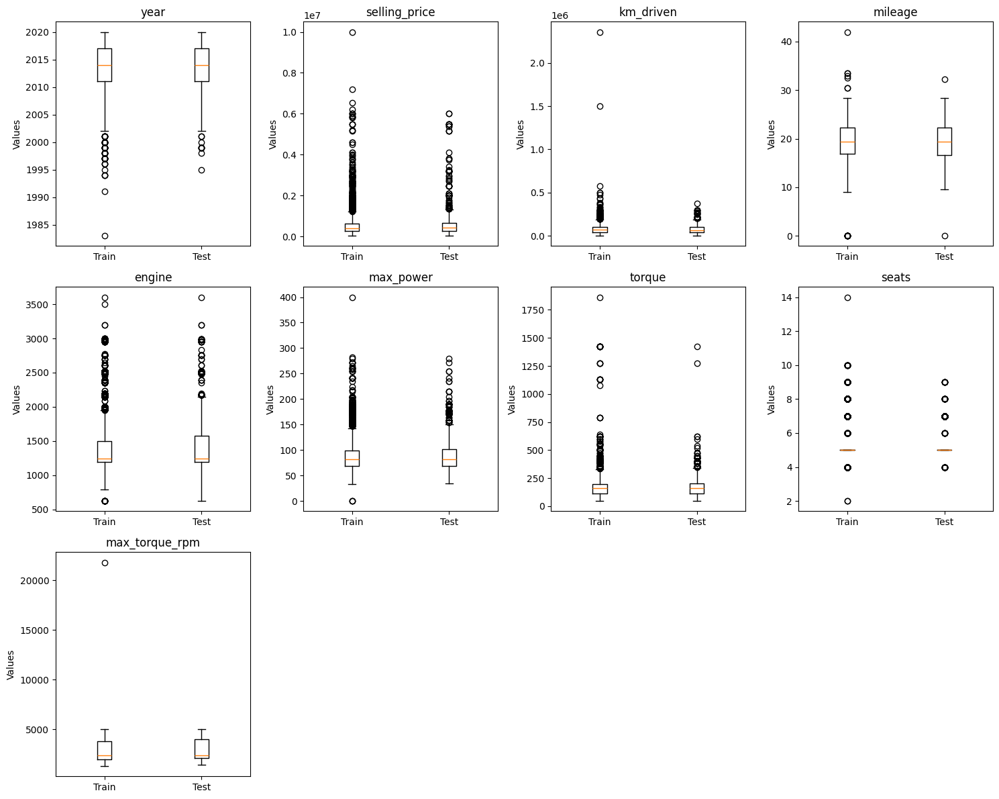

In [24]:
# Получаем числовые колонки
numeric_columns = df_train.select_dtypes(include=['number']).columns

n_cols = 4
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols 

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 4*n_rows))
axes = axes.flatten()

for i, col in enumerate(numeric_columns):
    data_to_plot = [df_train[col].dropna(), df_test[col].dropna()]
    axes[i].boxplot(data_to_plot, labels=['Train', 'Test'])
    axes[i].set_title(col)
    axes[i].set_ylabel('Values')

# Скрываем лишние subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

### Выводы:
1) Средние значения и медиана не сильно различается для числовых признаков в трейн и тест выборках, что может говорить об однородности исходных данных. Но стоит помнить, что есть еще скрытые числовые признаки в данных (которые сейчас определяются как текст или категориальные), которые необходимо сначала предобработать и так же провести сравнение.
2) В трейн-выборке по всем 4-м числовым признакам размах в данных чуть больше, чем в тест-выборке.
3) В целом по всем представленным числовым признакам данные и в трейн и тест выборке однородны. Статистики очень похожи, единственное, как я уже отмечал выше, в трейн выборке по некоторым признакам размах значений чуть больше чем в тест выборке;
4) У меня нет оснований предполагать, что заполнение пропусков медианой сдвинуло распределения в наших данных. Почему:
   - во первых, пропусков было немного;
   - для заполнения пропусков мы использовали медиану, а она робастна к сдвигам в данных;
5) Но мы могли бы получить сдвиг, если бы:
   - для заполнения мы использовали например среднее значение;
   - пропусков в данных, особенно в тесте было бы больше;
   - если бы распределения в признаках были бы сильно асимметричными, и медиана и среднее значительно бы различались.

#### Посмотрим на категориальные признаки

In [25]:
# Для train датасета
train_stats_num = df_train.describe(include='object').round(2)
print("Статистики категориальных и текстовых столбцов - TRAIN:")
display(train_stats_num)

# Для test датасета  
test_stats_num = df_test.describe(include='object').round(2)
print("\nСтатистики категориальных и текстовых столбцов - TEST:")
display(test_stats_num)

Статистики категориальных и текстовых столбцов - TRAIN:


,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603



Статистики категориальных и текстовых столбцов - TEST:


,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


### Выводы:
1) По признакам `fuel`, `seller_type`, `transmission`, `owner` трейн и тест выборки кажутся более-менее однородными;
2) По признаку `name` трейн-выборка более "богата" по возможным уникальным значениям.

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

<Figure size 1500x1200 with 0 Axes>

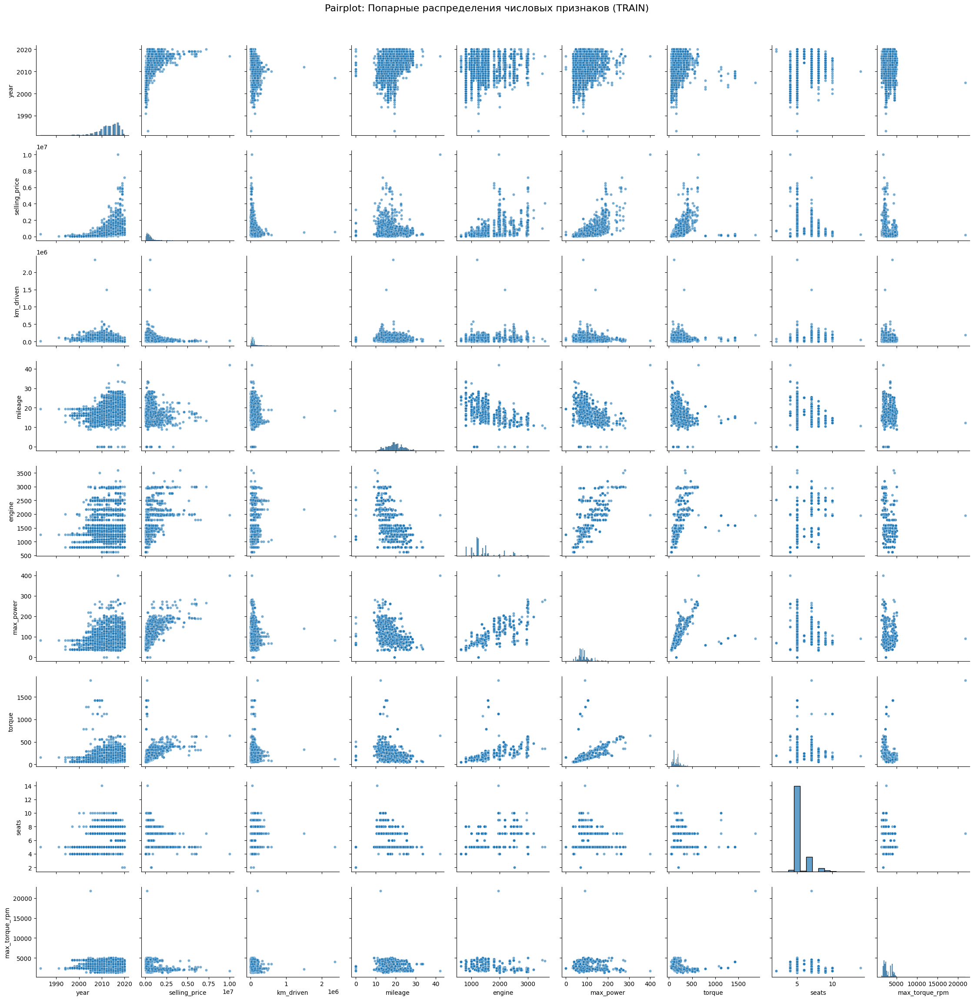

In [26]:
#sns.set()
plt.figure(figsize=(15, 12))
pairplot = sns.pairplot(df_train[numeric_columns], 
                       diag_kind='hist', 
                       plot_kws={'alpha': 0.6, 's': 20},
                       diag_kws={'alpha': 0.7})

plt.suptitle('Pairplot: Попарные распределения числовых признаков (TRAIN)', 
             y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

Основные закономерности, которые можно увидеть на графиках распределения:
1) отсутствие гомоскедастичности у любых двух признаков;
2) зависимость наиболее выражена у целевой переменной `selling_price` c `year` (здесь воззможна квадратичная форма зависимости на первый взгляд), `km_driven`, `max_power` и `max_power`. Но нельзя сказать что тут имеется чисто линейная зависимость, скорее есть корреляция о которой было сказано выше;
3) наблюдается хорошая связь между признаками `mileage` и `engine`, `engine` и `max_power`, `engine` и `torque`, `max_power` и `torque` что впринципе логично для автомобилей. Здесь можно говорить о достаточно хорошей корреляции признаков;
4) менее выражена зависимость между признаком `max_torque_rpm` и остальными признаками. Так же отмечается единичный выброс на графике по этому признаку, возможно если убрать выброс графики бы лучше визуализировали взаимное влияние (это же кстати относится и к другим попарным графикам!).

<Figure size 1500x1200 with 0 Axes>

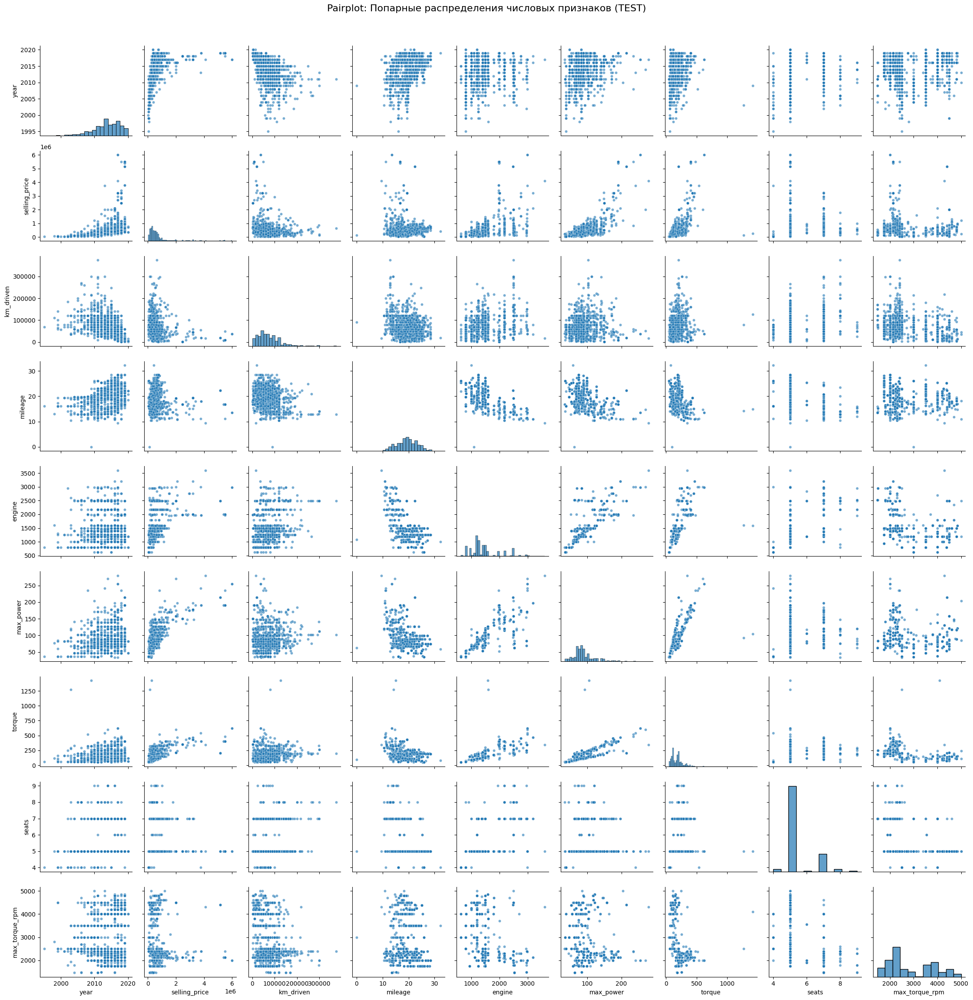

In [27]:
#sns.set()
plt.figure(figsize=(15, 12))
pairplot = sns.pairplot(df_test[numeric_columns], 
                       diag_kind='hist', 
                       plot_kws={'alpha': 0.6, 's': 20},
                       diag_kws={'alpha': 0.7})

plt.suptitle('Pairplot: Попарные распределения числовых признаков (TEST)', 
             y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

В целом я вижу в тестовой выборке точно такие же закономерностив попарных распределениях что и в трейн-выборке (если не считать наличие различных выбросов в той и другой выборках).

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [28]:
corr = df_train[numeric_columns].corr()
corr

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.341334,0.002819,0.156858,0.053204,0.041178,0.031243
selling_price,0.427279,1.000000,-0.164828,-0.104769,0.447672,0.692814,0.466249,0.149953,-0.178117
km_driven,-0.368966,-0.164828,1.000000,-0.182086,0.229766,0.024588,0.112781,0.192328,-0.231266
mileage,0.341334,-0.104769,-0.182086,1.000000,-0.572893,-0.373390,-0.237106,-0.451059,-0.091734
engine,0.002819,0.447672,0.229766,-0.572893,1.000000,0.681117,0.599154,0.652172,-0.384411
max_power,0.156858,0.692814,0.024588,-0.373390,0.681117,1.000000,0.659416,0.244112,-0.155315
torque,0.053204,0.466249,0.112781,-0.237106,0.599154,0.659416,1.000000,0.315810,-0.368625
seats,0.041178,0.149953,0.192328,-0.451059,0.652172,0.244112,0.315810,1.000000,-0.297876
max_torque_rpm,0.031243,-0.178117,-0.231266,-0.091734,-0.384411,-0.155315,-0.368625,-0.297876,1.000000


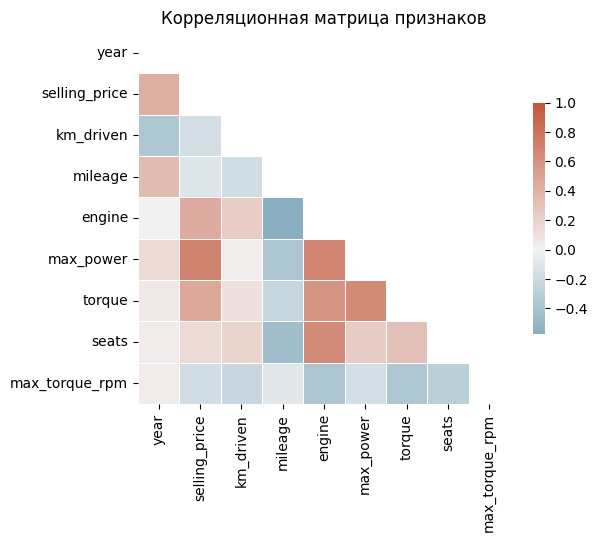

In [29]:
# построим тепловую карту корреляции
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(6, 6))
sns.heatmap(corr, mask=mask, cmap=sns.diverging_palette(230, 20, as_cmap=True), 
            vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Корреляционная матрица признаков')
plt.show();

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

### Ответы на вопросы:
1) Наименее скоррелированы признаки `engine` и `year`, что скорее всего логично, ведь двигатель не сильно зависит от года выпуска в период с 1985 по 2020 год.
2) Довольно сильная положительная линейная зависимость наблюдается между `max_power` и `selling_price`, что можно объяснить наверное тем, что чем мощнее двигатель автомобиля, тем он дороже. Так же сильная положительная линейная зависисмость наблюдается между `engine` и `max_power`, `engine` и `torque`, `engine` и `seats`, `torque` и `max_power` В целом скорее всего в линейной модели эти признаки будут играть важную роль в предсказании целевой переменной - цены;
3) Нет, корреляция не говорит нам о причинно-следственной связи. Мы можем ли сказать, что год выпуска имеет обратную зависимость от того сколько километров проехало авто. Но здравый смысл подсказывает, что так и есть, чаще всего автомобили раннего года выпуска дейсвтительно имеют больший пробег к дате продажи.

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

### 1) Построим тепловую карту корреляции Спирмена

In [30]:
corr = df_train[numeric_columns].corr(method='spearman')
print("Матрица корреляций Спирмена рассчитанная с помощью pd.corr():")
corr

Матрица корреляций Спирмена рассчитанная с помощью pd.corr():


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.346132,-0.038056,0.165798,0.102711,0.048291,0.000153
selling_price,0.707123,1.000000,-0.295665,0.026186,0.463577,0.612258,0.582109,0.317605,-0.259146
km_driven,-0.569659,-0.295665,1.000000,-0.198466,0.304504,0.040919,0.242715,0.195317,-0.308592
mileage,0.346132,0.026186,-0.198466,1.000000,-0.429871,-0.308824,-0.161934,-0.435458,-0.154740
engine,-0.038056,0.463577,0.304504,-0.429871,1.000000,0.713113,0.842119,0.527716,-0.471745
max_power,0.165798,0.612258,0.040919,-0.308824,0.713113,1.000000,0.779275,0.304857,-0.155312
torque,0.102711,0.582109,0.242715,-0.161934,0.842119,0.779275,1.000000,0.437786,-0.652654
seats,0.048291,0.317605,0.195317,-0.435458,0.527716,0.304857,0.437786,1.000000,-0.316070
max_torque_rpm,0.000153,-0.259146,-0.308592,-0.154740,-0.471745,-0.155312,-0.652654,-0.316070,1.000000


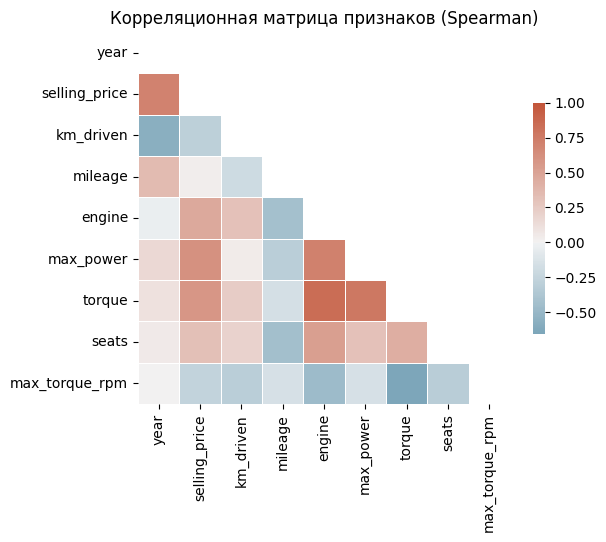

In [31]:
# построим тепловую карту корреляции
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(6, 6))
sns.heatmap(corr, mask=mask, cmap=sns.diverging_palette(230, 20, as_cmap=True), 
            vmax=1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.title('Корреляционная матрица признаков (Spearman)')
plt.show();

### Выводы:
Если сравнить с корреляцией Пирсона, то:
   - По Спирмену корреляция сильнее между признаками: `selling_price` и `year`, `selling_price` и `torque`, `km_driven` и `year`, `selling_price` и `seats`, `engine` и `mileage`, `engine` и `seats`, `torque` и `engine`, `torque` и `max_power`, `max_torque_rpm` и `torque`;
   - Стала положителной корреляция между `mileage` и `selling_price`;
  
Увеличение корреляции между признаками при расчете корреляции Спирмана, могут говорить о нелинейныйх зависимостях в этих признаках.  

### 2) Построим гистограмму распределения целевого признака в трейн и тест выборках

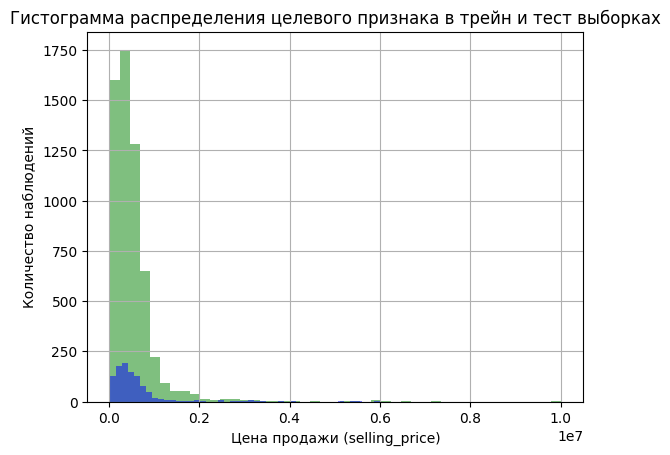

In [32]:
df_train['selling_price'].hist(bins=45, alpha=0.5, color='green')
df_test['selling_price'].hist(bins=45, alpha=0.5, color='blue')

plt.title('Гистограмма распределения целевого признака в трейн и тест выборках')
plt.xlabel('Цена продажи (selling_price)')
plt.ylabel('Количество наблюдений')

# Показываем график
plt.show();

### Вывод:
1) По гистограмме можно видеть, что распределение целевого признака тест выборке в целом повторяет распределение в трейн-выборке;
2) Как и ожидалось распределение целевой переменной имеет логнормальное распределение с правосторонней асимметрией. Для обучения наилучшей модели предлагается провести логарифмическое преобразование целевого признака.

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [33]:
df_train_only_float = df_train[numeric_columns]
df_test_only_float = df_test[numeric_columns]

In [34]:
y_train = df_train_only_float['selling_price'] # your code here
X_train = df_train_only_float.drop('selling_price', axis=1) # your code here

In [35]:
assert X_train.shape == (5840, 8)

In [36]:
y_test = df_test_only_float['selling_price'] # your code here
X_test = df_test_only_float.drop('selling_price', axis=1) # your code here

In [37]:
assert X_test.shape == (1000, 8)

Я подразумеваю что в задании закралась ошибка, так как мы на стадии предобработки данных смогли распарсить колонку `torque` и получить два дополнительных признака. Поэтому с учетом колонки `seats` у нас получится не 6 ыещественных признаков, а 8.

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [38]:
def lr_trainer(X_train, X_test, y_train, y_test):
    
    # обучимм модель линейной регрессии
    lr = LinearRegression()
    lr.fit(X_train, y_train)
    
    # получим предсказания для трейн и тест выборок
    y_train_pred = lr.predict(X_train)
    y_test_pred = lr.predict(X_test)
    
    # рассчитаем коэффициент детерминации на трейн и тест выборках
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    # а так же MSE - среднеквадратичную ошибку
    mse_train = MSE(y_train, y_train_pred)
    mse_test = MSE(y_test, y_test_pred)
    
    # вывод метрик
    print("Результаты обучения линейной регрессии:")
    print(f"Train R^2: {r2_train:.3f}")
    print(f"Test R^2:  {r2_test:.3f}")
    print(f"Train MSE: {mse_train:.2f}")
    print(f"Test MSE:  {mse_test:.2f}")

    return lr, y_train_pred, y_test_pred

lr_model, *lr_y_pred = lr_trainer(X_train, X_test, y_train, y_test)

Результаты обучения линейной регрессии:
Train R^2: 0.602
Test R^2:  0.599
Train MSE: 114205290301.24
Test MSE:  230302630366.98


### Выводы:
1) В целом метрики качества не очень высокие - качество модели не высокое;
2) R^2 практически одинаков на трейн и тест выборках - на первый взгляд модель не переобучена;
3) Показатель R^2 можно интерпретировать так: наша линейная модель объясняет 60% дисперсии данных. Этого не достаточно, модель не использует все возможные признаки, скорее всего существует нелинейная зависимость, линейная модель не учитывает все важные закономерности в данных;
4) Очень большая разница в метрике MSE (более чем в 2 раза) на тест выборке. При одинаковом R^2 можно говорить о разном распределении целевой переменной в трейн и тест выборках (мы это видели на этапе EDA-анализа), в трейн выборке есть более сиьные выбросы и мы возможно смещаемся по метрике из-за них;
5) Возможно стоило бы использовать вместо R^2 - adjusted_R^2.

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [39]:
scaler = StandardScaler()

# обучим scaler на тренировочных данных
scaler.fit(X_train)

# стандартизируем тренировочные и тестовые данные
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr_model, *y_pred = lr_trainer(X_train_scaled, X_test_scaled, y_train, y_test)

Результаты обучения линейной регрессии:
Train R^2: 0.602
Test R^2:  0.599
Train MSE: 114205290301.24
Test MSE:  230302630366.98


### Вывод:
Как видно по результатам, стандартизация не улучшила качество линейной модели (как в принципе и ожидалось)

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [40]:
# получим названия признаков
feature_names = scaler.feature_names_in_.tolist()

# получим коэффициенты модели
coefficients = lr_model.coef_

# DataFrame c результатами важности признаков
feature_importance_df = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefficients,
    'abs_coefficient': np.abs(coefficients)
})

# сортируем по абсолютному значению коэффициента
feature_importance_df = feature_importance_df.sort_values(
    'abs_coefficient', 
    ascending=False
).reset_index(drop=True)

# вывод первых 5 значимых признаков
feature_importance_df.head()

,feature,coefficient,abs_coefficient
0,max_power,324709.510638,324709.510638
1,year,165655.093252,165655.093252
2,max_torque_rpm,-63253.868393,63253.868393
3,km_driven,-49868.538791,49868.538791
4,seats,-32486.621259,32486.621259


### Вывод:
Как и ожидалось, самый значимый признак по абсолютному значению - это `max_power`. Он имеет самую сильную положительную линейную связь (мы это видели ранее в EDA-анализе).

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [41]:
def lasso_trainer(X_train, X_test, y_train, y_test):
    
    # обучимм модель линейной регрессии c l1 регуляризацией
    lr = Lasso()
    lr.fit(X_train, y_train)
    
    # получим предсказания для трейн и тест выборок
    y_train_pred = lr.predict(X_train)
    y_test_pred = lr.predict(X_test)
    
    # рассчитаем коэффициент детерминации на трейн и тест выборках
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    # а так же MSE - среднеквадратичную ошибку
    mse_train = MSE(y_train, y_train_pred)
    mse_test = MSE(y_test, y_test_pred)
    
    # вывод метрик
    print("Результаты обучения линейной регрессии:")
    print(f"Train R^2: {r2_train:.3f}")
    print(f"Test R^2:  {r2_test:.3f}")
    print(f"Train MSE: {mse_train:.2f}")
    print(f"Test MSE:  {mse_test:.2f}")

    return lr, y_train_pred, y_test_pred

lasso_model, *lasso_y_pred = lasso_trainer(X_train_scaled, X_test_scaled, y_train, y_test)

Результаты обучения линейной регрессии:
Train R^2: 0.602
Test R^2:  0.599
Train MSE: 114205290314.19
Test MSE:  230303350106.80


In [42]:
# получим коэффициенты модели
coefficients = lasso_model.coef_

# DataFrame c результатами важности признаков
feature_importance_df = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefficients,
    'abs_coefficient': np.abs(coefficients)
})

# сортируем по абсолютному значению коэффициента
feature_importance_df = feature_importance_df.sort_values(
    'abs_coefficient', 
     ascending=True
).reset_index(drop=True)

# вывод последних 5 незначимых признаков
feature_importance_df.head()

,feature,coefficient,abs_coefficient
0,torque,7007.797888,7007.797888
1,mileage,-9765.809825,9765.809825
2,engine,16577.113285,16577.113285
3,seats,-32482.633426,32482.633426
4,km_driven,-49867.570867,49867.570867


### Выводы (ответы на вопросы):
1) Применение lasso-регрессии не улучшило качество предсказания стоимости;
2) Lasso-модель не занулила ни один признак. Возможные причины: значение **alpha** (степень регуляризации) по умолчанию равный 1.0 недостаточен, чтобы лассо-модель занулила некоторые веса модели. Можно предположить что это произошло из-за огромного масштаба целевой переменной,
что требует бОльших значений alpha для преодоления вклада признаков в минимизацию MSE. Так же, если бы мы возможно подали в модель нестандартизированные признаки, то увидели бы какие-то признаки близкие к 0.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [43]:
np.logspace(-3, 5, 20)

array([1.00000000e-03, 2.63665090e-03, 6.95192796e-03, 1.83298071e-02,
       4.83293024e-02, 1.27427499e-01, 3.35981829e-01, 8.85866790e-01,
       2.33572147e+00, 6.15848211e+00, 1.62377674e+01, 4.28133240e+01,
       1.12883789e+02, 2.97635144e+02, 7.84759970e+02, 2.06913808e+03,
       5.45559478e+03, 1.43844989e+04, 3.79269019e+04, 1.00000000e+05])

In [44]:
def lasso_gd_cv_trainer(X_train, y_train, cv_folds=10):
    """
    Выполняет Grid Search для Lasso регрессии с кросс-валидацией
    """
    
    # определим сетку параметров для Lasso-регресии
    # учитывая предыдущие результаты - нужны большие alpha
    param_grid = {
        'alpha': np.logspace(-3, 5, 20),  # от 0.001 до 100000
        'max_iter': [1000, 5000, 10000, 15000],
        'selection': ['cyclic', 'random'],
        'warm_start': [True, False]
    }
    
    print(f"Сетка параметров для Grid Search:")
    print(f"  alpha: {len(param_grid['alpha'])} значений от {param_grid['alpha'][0]:.3f} до {param_grid['alpha'][-1]:.1f}")
    print(f"  max_iter: {param_grid['max_iter']}")
    print(f"  selection: {param_grid['selection']}")
    print(f"  warm_start: {param_grid['warm_start']}")
    
    # создаем модель
    lasso = Lasso(random_state=777)

    # создаем Grid Search
    grid_search = GridSearchCV(
        estimator=lasso,
        param_grid=param_grid,
        cv=cv_folds,  
        scoring='r2',  
        n_jobs=-1,      
        verbose=1,
        return_train_score=True,
        refit=True     # переобучаем на всех данных с лучшими параметрами
    )
    
    # вывод информации по Grid Search
    print(f"\nЗапускаем Grid Search...")
    print(f"Количество комбинаций: {len(param_grid['alpha']) * len(param_grid['warm_start']) * len(param_grid['max_iter']) * len(param_grid['selection'])}")
    print(f"Количество фолдов: {cv_folds}")
    print(f"Общее количество обучений: {len(param_grid['alpha']) * len(param_grid['warm_start']) * len(param_grid['max_iter']) * len(param_grid['selection']) * cv_folds}")

    # запуск обучения с подбором гиперпараметров
    grid_search.fit(X_train, y_train)
    
    # вывод результатов
    print(f"\nЭтап подбора завершен!")
    print(f"Лучшие параметры: {grid_search.best_params_}")
    print(f"Лучший R2: {grid_search.best_score_:.4f}")
    
    return grid_search, param_grid

# Запускаем Grid Search
grid_search_lasso, param_grid_lasso = lasso_gd_cv_trainer(X_train_scaled, y_train)

Сетка параметров для Grid Search:
  alpha: 20 значений от 0.001 до 100000.0
  max_iter: [1000, 5000, 10000, 15000]
  selection: ['cyclic', 'random']
  warm_start: [True, False]

Запускаем Grid Search...
Количество комбинаций: 320
Количество фолдов: 10
Общее количество обучений: 3200
Fitting 10 folds for each of 320 candidates, totalling 3200 fits

Этап подбора завершен!
Лучшие параметры: {'alpha': 14384.4988828766, 'max_iter': 1000, 'selection': 'cyclic', 'warm_start': True}
Лучший R2: 0.5826


In [45]:
# сохраним предсказания на тесте для лучшей модели
gd_lasso_y_pred = grid_search_lasso.best_estimator_.predict(X_test_scaled)

In [46]:
# берем лучшую модель
best_model = grid_search_lasso.best_estimator_

# вывод значений весов
coefficients = best_model.coef_

feature_importance_df = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefficients,
    'abs_coefficient': np.abs(coefficients)
})

feature_importance_df

,feature,coefficient,abs_coefficient
0,year,151092.015124,151092.015124
1,km_driven,-36162.012330,36162.012330
2,mileage,0.000000,0.000000
3,engine,0.000000,0.000000
4,max_power,327006.957769,327006.957769
5,torque,0.000000,0.000000
6,seats,-0.000000,0.000000
7,max_torque_rpm,-43271.224292,43271.224292


### Выводы (ответы на вопросы):
1) С помощью Grid Search для поиска гиперпараметров c учетом кросс-валидации было обучено 3200 линейных моделей;
2) Коэффициент регуляризации лучшей модели равен 14384,5, при этом занулились веса при следующих признаках: `mileage`, `engine`, `torque`, `seats`.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [47]:
def elasticnet_gd_cv_trainer(X_train, y_train, cv_folds=10):
    """
    Выполняет Grid Search для ElasticNet регрессии с кросс-валидацией
    """
    
    # определим сетку параметров для Lasso-регресии
    # учитывая предыдущие результаты - нужны большие alpha
    param_grid = {
        'alpha': np.logspace(-3, 5, 20),  # от 0.001 до 100000
        'l1_ratio': [0.1, 0.2, 0.4, 0.6, 0.8, 1.0],
        'max_iter': [1000, 5000, 10000, 15000],
        'selection': ['cyclic', 'random'],
        'warm_start': [True, False]
    }
    
    print(f"Сетка параметров для Grid Search:")
    print(f"  alpha: {len(param_grid['alpha'])} значений от {param_grid['alpha'][0]:.3f} до {param_grid['alpha'][-1]:.1f}")
    print(f"  l1_ratio: {param_grid['l1_ratio']}")
    print(f"  max_iter: {param_grid['max_iter']}")
    print(f"  selection: {param_grid['selection']}")
    print(f"  warm_start: {param_grid['warm_start']}")
    
    # создаем модель
    elastic_net = ElasticNet(random_state=777, fit_intercept=True)

    # создаем Grid Search
    grid_search = GridSearchCV(
        estimator=elastic_net,
        param_grid=param_grid,
        cv=cv_folds,  
        scoring='r2',  
        n_jobs=-1,      
        verbose=1,
        return_train_score=True,
        refit=True     # переобучаем на всех данных с лучшими параметрами
    )
    
    # вывод информации по Grid Search
    print(f"\nЗапускаем Grid Search...")
    print(f"Количество комбинаций: {len(param_grid['alpha']) * len(param_grid['max_iter']) * len(param_grid['selection'])}")
    print(f"Количество фолдов: {cv_folds}")
    print(f"Общее количество обучений: {len(param_grid['alpha']) * len(param_grid['max_iter']) * len(param_grid['selection']) * cv_folds}")

    # запуск обучения с подбором гиперпараметров
    grid_search.fit(X_train, y_train)
    
    # вывод результатов
    print(f"\nЭтап подбора завершен!")
    print(f"Лучшие параметры: {grid_search.best_params_}")
    print(f"Лучший R2: {grid_search.best_score_:.4f}")
    
    return grid_search, param_grid

# Запускаем Grid Search
grid_search_elasticnet, param_grid_elasticnet = elasticnet_gd_cv_trainer(X_train_scaled, y_train)

Сетка параметров для Grid Search:
  alpha: 20 значений от 0.001 до 100000.0
  l1_ratio: [0.1, 0.2, 0.4, 0.6, 0.8, 1.0]
  max_iter: [1000, 5000, 10000, 15000]
  selection: ['cyclic', 'random']
  warm_start: [True, False]

Запускаем Grid Search...
Количество комбинаций: 160
Количество фолдов: 10
Общее количество обучений: 1600
Fitting 10 folds for each of 1920 candidates, totalling 19200 fits

Этап подбора завершен!
Лучшие параметры: {'alpha': 14384.4988828766, 'l1_ratio': 1.0, 'max_iter': 1000, 'selection': 'cyclic', 'warm_start': True}
Лучший R2: 0.5826


In [48]:
# сохраним предсказания на тесте для лучшей модели
gd_elasticnet_y_pred = grid_search_elasticnet.best_estimator_.predict(X_test_scaled)

### Выводы (ответы на вопросы):
1) С помощью Grid Search для поиска гиперпараметров c учетом кросс-валидации было обучено 19200 линейных моделей;
2) Гиперпараметры лучшей модели: **alpha** = 14384.5, **l1_ratio** = 1.5, **max_iter** = 1000, **selection** = cyclic, **warm_start** = True;
3) В целом оченивая качество модели ElasticNet по метрике R^2 мы не смогли улучшить качество.

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

In [49]:
def multi_encoding(df_train, df_test, name_col, target_col=None, top_n=20, hashing_n_features=10):
    """
    Эффективная версия комбинированного кодирования:
    1)Frequency Encoding
    2) One-hot для топ-N
    3) Target Encoding 
    4) HASHING TRICK (Хеширование)
    """
    
    df_train_encoded = df_train.copy()
    df_test_encoded = df_test.copy()
    
    # Frequency Encoding
    freq = df_train_encoded[name_col].value_counts()
    df_train_encoded[f'{name_col}_freq'] = df_train[name_col].map(freq)
    df_test_encoded[f'{name_col}_freq'] = df_test[name_col].map(freq)
    # если в тестовой выборке нет такой категории заполняем пропуск 0
    df_test_encoded[f'{name_col}_freq'] = df_test_encoded[f'{name_col}_freq'].fillna(0)
    # логарифмированная частота
    df_train_encoded[f'{name_col}_freq_log'] = np.log1p(df_train_encoded[f'{name_col}_freq'])
    df_test_encoded[f'{name_col}_freq_log'] = np.log1p(df_test_encoded[f'{name_col}_freq'])
    
    # Top-N категорий
    top_cats = freq.head(top_n).index
    
    # One-hot для топ-N
    for i, cat in enumerate(top_cats, 1):
        df_train_encoded[f'{name_col}_cat_{i:02d}'] = (df_train[name_col] == cat).astype(int)
        df_test_encoded[f'{name_col}_cat_{i:02d}'] = (df_test[name_col] == cat).astype(int)
    
    # df_encoded[f'{name_col}_is_other'] = (~df_train[name_col].isin(top_cats)).astype(int)
    
    # Target Encoding 
    if target_col and target_col in df_train.columns:
        # Сглаженное среднее
        global_mean = df_train[target_col].mean()
        # коэф. сглаживания
        smoothing = 100
        
        def smoothed_target(group):
            '''Функция возвращает сглаженное кодирование target encoding'''
            n = len(group)
            if n == 0:
                return global_mean
            group_mean = group.mean()
            return (n * group_mean + smoothing * global_mean) / (n + smoothing)

        # посчитаем target encoder
        target_map = df_train.groupby(name_col)[target_col].apply(smoothed_target).to_dict()
        # применим на трейн и тест выборке
        df_train_encoded[f'{name_col}_target'] = df_train[name_col].map(target_map)
        df_test_encoded[f'{name_col}_target'] = df_test[name_col].map(target_map)
        # если в тестовой выборке нет такой категории заполняем пропуск просто глобальным средним
        df_test_encoded[f'{name_col}_target'] = df_test_encoded[f'{name_col}_target'].fillna(global_mean)

    # Преобразуем строки в формат для хеширования
    name_strings_train = [[str(x)] for x in df_train[name_col].values]
    name_strings_test = [[str(x)] for x in df_test[name_col].values]
    
    # Создаем FeatureHasher
    hasher = FeatureHasher(n_features=hashing_n_features, input_type='string')
    
    # Применяем хеширование
    hashed_features_train = hasher.transform(name_strings_train).toarray()
    hashed_features_test = hasher.transform(name_strings_test).toarray()
    
    # Создаем DataFrame с хешированными признаками
    hashed_train_df = pd.DataFrame(
        hashed_features_train,
        columns=[f'{name_col}_hash_{i}' for i in range(hashing_n_features)],
        index=df_train.index
    )
    hashed_test_df = pd.DataFrame(
        hashed_features_test,
        columns=[f'{name_col}_hash_{i}' for i in range(hashing_n_features)],
        index=df_test.index
    )
    
    # Добавляем к основному DataFrame
    df_train_encoded = pd.concat([df_train_encoded, hashed_train_df], axis=1)
    df_test_encoded = pd.concat([df_test_encoded, hashed_test_df], axis=1)

    # Также создаем агрегированные признаки из хешированных
    df_train_encoded[f'{name_col}_hash_sum'] = hashed_features_train.sum(axis=1)
    df_train_encoded[f'{name_col}_hash_mean'] = hashed_features_train.mean(axis=1)
    df_train_encoded[f'{name_col}_hash_std'] = hashed_features_train.std(axis=1)
    df_test_encoded[f'{name_col}_hash_sum'] = hashed_features_test.sum(axis=1)
    df_test_encoded[f'{name_col}_hash_mean'] = hashed_features_test.mean(axis=1)
    df_test_encoded[f'{name_col}_hash_std'] = hashed_features_test.std(axis=1)
    
    # Удалим исходную колонку
    df_train_encoded = df_train_encoded.drop(columns=[name_col])
    df_test_encoded = df_test_encoded.drop(columns=[name_col])
    
    return df_train_encoded, df_test_encoded

In [50]:
X_train_cat, X_test_cat = multi_encoding(df_train, df_test, name_col='name', target_col='selling_price')

In [51]:
assert X_train_cat.shape == (5840, 49)

In [52]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840
unique,4,3,2,5
top,Diesel,Individual,Manual,First Owner
freq,3177,5223,5336,3603


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [53]:
# Создаем OneHotEncoder с drop='first'
encoder = OneHotEncoder(
    drop='first',  # удаляем первую категорию для каждого признака
    sparse_output=False,  # возвращаем dense array
    handle_unknown='ignore',  # игнорируем неизвестные значения
)
# Обучим ohe кодирование на трейн выборке
encoded_train_array = encoder.fit_transform(X_train_cat['seats'].values.reshape(-1, 1))
# Применим на тест выборке
encoded_test_array = encoder.transform(X_test_cat['seats'].values.reshape(-1, 1))

# Получим имена новых колонок
feature_names = encoder.get_feature_names_out(['seats'])

# Создаем DataFrame с закодированными признаками train
encoded_train_df = pd.DataFrame(
    encoded_train_array,
    columns=feature_names,
    index=df_train.index
)
# Создаем DataFrame с закодированными признаками test
encoded_test_df = pd.DataFrame(
    encoded_test_array,
    columns=feature_names,
    index=df_test.index
)

# Добавляем к основному DataFrame
X_train_cat = pd.concat([X_train_cat, encoded_train_df], axis=1)
X_test_cat = pd.concat([X_test_cat, encoded_test_df], axis=1)

# Удалим исходную колонку и остальные категориальные признаки и целевую переменную
X_train_cat = X_train_cat.drop(columns=['seats', 'fuel', 'seller_type', 'transmission', 'owner', 'selling_price'])
X_test_cat = X_test_cat.drop(columns=['seats', 'fuel', 'seller_type', 'transmission', 'owner', 'selling_price'])

In [54]:
X_test_cat.head()

,year,km_driven,mileage,engine,max_power,torque,max_torque_rpm,name_freq,name_freq_log,name_cat_01,...,name_hash_mean,name_hash_std,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,2010,168000,14.0,2498,112.0,260.0,2000.0,1.0,0.693147,0,...,-0.1,0.3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,2017,25000,21.5,1497,108.5,260.0,2125.0,0.0,0.000000,0,...,0.1,0.3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2007,218463,12.9,1799,130.0,172.0,4300.0,0.0,0.000000,0,...,0.1,0.3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2015,173000,25.1,1498,98.6,200.0,1750.0,10.0,2.397895,0,...,-0.1,0.3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2011,70000,16.5,1172,65.0,96.0,3000.0,0.0,0.000000,0,...,0.1,0.3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### Нормализуем числовые признаки

In [55]:
scaler = StandardScaler()

# обучим scaler на тренировочных данных
scaler.fit(X_train_cat)

# стандартизируем тренировочные и тестовые данные
X_train_scaled = scaler.transform(X_train_cat)
X_test_scaled = scaler.transform(X_test_cat)

In [56]:
# сохраним названия колонок (фичей)
feature_names = scaler.feature_names_in_.tolist()

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

##### Так же как упоминал ранее предлагают перед обучением произвести логарифмическое преобразование целевой переменной.

In [57]:
def ridge_gd_cv_trainer(X_train, y_train, cv_folds=10):
    """
    Выполняет Grid Search для Lasso регрессии с кросс-валидацией
    """
    
    # определим сетку параметров для Ridge-регресии
    param_grid = {
        'alpha': np.logspace(-3, 5, 20),  # от 0.001 до 100000
        'max_iter': [1000, 5000, 10000, 15000],
    }
    
    print(f"Сетка параметров для Grid Search:")
    print(f"  alpha: {len(param_grid['alpha'])} значений от {param_grid['alpha'][0]:.3f} до {param_grid['alpha'][-1]:.1f}")
    print(f"  max_iter: {param_grid['max_iter']}")
    
    # создаем модель
    ridge = Ridge(random_state=777)

    # создаем Grid Search
    grid_search = GridSearchCV(
        estimator=ridge,
        param_grid=param_grid,
        cv=cv_folds,  
        scoring='r2',  
        n_jobs=-1,      
        verbose=1,
        return_train_score=True,
        refit=True     # переобучаем на всех данных с лучшими параметрами
    )
    
    # вывод информации по Grid Search
    print(f"\nЗапускаем Grid Search...")
    print(f"Количество комбинаций: {len(param_grid['alpha']) * len(param_grid['max_iter'])}")
    print(f"Количество фолдов: {cv_folds}")
    print(f"Общее количество обучений: {len(param_grid['alpha']) * len(param_grid['max_iter']) * cv_folds}")

    # запуск обучения с подбором гиперпараметров
    grid_search.fit(X_train, y_train)
    
    # вывод результатов
    print(f"\nЭтап подбора завершен!")
    print(f"Лучшие параметры: {grid_search.best_params_}")
    print(f"Лучший R2: {grid_search.best_score_:.4f}")
    
    return grid_search, param_grid

# логарифмическое преобразование
y_train_log = np.log1p(y_train)
# Запускаем Grid Search
grid_search_ridge, param_grid_ridge = ridge_gd_cv_trainer(X_train_scaled, y_train_log)

Сетка параметров для Grid Search:
  alpha: 20 значений от 0.001 до 100000.0
  max_iter: [1000, 5000, 10000, 15000]

Запускаем Grid Search...
Количество комбинаций: 80
Количество фолдов: 10
Общее количество обучений: 800
Fitting 10 folds for each of 80 candidates, totalling 800 fits

Этап подбора завершен!
Лучшие параметры: {'alpha': 0.8858667904100823, 'max_iter': 1000}
Лучший R2: 0.8544


In [58]:
# сохраним предсказания на тесте для лучшей модели
gd_ridge_y_pred = np.expm1(grid_search_ridge.best_estimator_.predict(X_test_scaled))

### Выводы:
Судя по метрике R^2 модель стала лучше, но необходимо помнить что r-квадрат мог вырасти не из-за улучшения качества модели, а из-за добавления новых признаков. Необходимо смотреть либо на adjusted-R2, либо метрики MSE, или лучше RMSE.

In [59]:
print('Метрики качества новой модели Ridge.')
print(f"Train MSE: {MSE(np.expm1(grid_search_ridge.best_estimator_.predict(X_train_scaled)), y_train):.2f}")
print(f"Test MSE:  {MSE(np.expm1(grid_search_ridge.best_estimator_.predict(X_test_scaled)), y_test):.2f}")
print(f"Train RMSE: {MSE(np.expm1(grid_search_ridge.best_estimator_.predict(X_train_scaled)), y_train, squared=False):.2f}")
print(f"Test RMSE:  {MSE(np.expm1(grid_search_ridge.best_estimator_.predict(X_test_scaled)), y_test, squared=False):.2f}")

Метрики качества новой модели Ridge.
Train MSE: 109930077117.33
Test MSE:  110641959637.77
Train RMSE: 331557.05
Test RMSE:  332628.86


In [60]:
print('Метрики качества старой модели Lasso.')
print(f"Train MSE: 114394592592.28")
print(f"Test MSE:  230552563295.37")
print(f"Train RMSE: {114394592592.28**0.5}")
print(f"Test RMSE:  {230552563295.37**0.5}")

Метрики качества старой модели Lasso.
Train MSE: 114394592592.28
Test MSE:  230552563295.37
Train RMSE: 338222.69674325525
Test RMSE:  480158.8938001357


### Выводы:
Судя по метрике MSE (или лучше видно по RMSE) модель стала лучше после обработки части категориальных признаков и логарифмическом преобразовании целевой переменной.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [61]:
def business_metric(y_true, y_pred, threshold=0.1):
    """
    Бизнес-метрика: доля прогнозов, отличающихся от реальных цен не более чем установленного threshold 
    """
    
    # Преобразуем в numpy массивы
    y_true = np.array(y_true).astype(float)
    y_pred = np.array(y_pred).astype(float)
    
    # Проверка на корректность данных
    if len(y_true) != len(y_pred):
        raise ValueError(f"Длины массивов не совпадают: y_true={len(y_true)}, y_pred={len(y_pred)}")
    
    if len(y_true) == 0 | len(y_pred) == 0:
        raise ValueError("Массивы не должны быть пустыми")
    
    # Вычисляем относительные ошибки
    # with np.errstate(divide='ignore', invalid='ignore'):
        # Обрабатываем случаи, когда y_true = 0
    relative_errors = np.abs((y_pred - y_true) / y_true)
        # Заменяем inf и nan на очень большие значения (не будут в пределах порога)
        # relative_errors = np.where(np.isfinite(relative_errors), relative_errors, np.inf)
    
    # Определяем, какие прогнозы в пределах порога
    within_threshold = relative_errors <= threshold
    
    # Вычисляем долю
    n_within = np.sum(within_threshold)
    n_total = len(y_true)
    proportion = n_within / n_total if n_total > 0 else 0.0

    print('Значение Бизнес метрики в долях:', proportion)

print('Показатель бизнес метрики для первой линейной модели на тестовой выборке:')
business_metric(y_test, lr_y_pred[1])

print('Показатель бизнес метрики для lasso-модели на тестовой выборке:')
business_metric(y_test, lasso_y_pred[1])

print('Показатель бизнес метрики для lasso-модели обученной с подбором гиперпараметров на тестовой выборке:')
business_metric(y_test, gd_lasso_y_pred)

print('Показатель бизнес метрики для elastic_net-модели обученной с подбором гиперпараметров на тестовой выборке:')
business_metric(y_test, gd_elasticnet_y_pred)

print('Показатель бизнес метрики для ridge-модели обученной с подбором гиперпараметров на тестовой выборке:')
business_metric(y_test, gd_ridge_y_pred)

Показатель бизнес метрики для первой линейной модели на тестовой выборке:
Значение Бизнес метрики в долях: 0.241
Показатель бизнес метрики для lasso-модели на тестовой выборке:
Значение Бизнес метрики в долях: 0.241
Показатель бизнес метрики для lasso-модели обученной с подбором гиперпараметров на тестовой выборке:
Значение Бизнес метрики в долях: 0.235
Показатель бизнес метрики для elastic_net-модели обученной с подбором гиперпараметров на тестовой выборке:
Значение Бизнес метрики в долях: 0.235
Показатель бизнес метрики для ridge-модели обученной с подбором гиперпараметров на тестовой выборке:
Значение Бизнес метрики в долях: 0.304


### Выводы:
1) Моделей, обученных с подбором гиперпараметров чуть хуже, чем модели обученные нативно;
2) Ridge-модель обученная на данных с предобработанными категориальными признаками `name`, `seats` и подбором гиперпараметров на 10 фолдах показала лучший показатель по бизнес-метрике (бизнес-метрика достигла значения 0.254). Но это всё же незначительный результат.
3) Для улучшения качества **линейной модели** предлагается:
   - Поработать с другими категориальными признаками, не вошедшими в обучение моделей;
   - Фич-инжиниринг, поиск интересных комбинаций фичей часто могут дать хороший результат;
   - Попробовать полиномиальные комбинации признаков;
   - Для сравнения моделей возможно использовать adjusted-R2 или RMSE;
   - Так как на этапе EDA анализа было обнаружено, что целевой признак в трейн выборке имеет большие значения, чем в тест выборке имеет смысл обучить квантильную модель с использованием медианы.

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 18 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами по проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)


## Сохранение всех необходимых артефактов для инференса модели

In [62]:
# сохраним обучающую выборку для инференса
df_train.to_parquet('df_train.parquet')

In [63]:
# сохраняем scaler
with open('Model_artefacts/scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f, protocol=pickle.HIGHEST_PROTOCOL)

In [64]:
#сохранение только лучшей модели
with open('Model_artefacts/model.pkl', 'wb') as f:
    pickle.dump(grid_search_ridge.best_estimator_, f, protocol=pickle.HIGHEST_PROTOCOL)

In [65]:
#сохранение названия используемых в модели фичей
with open('Model_artefacts/feature_names.pkl', 'wb') as f:
    pickle.dump(feature_names, f, protocol=pickle.HIGHEST_PROTOCOL)

In [66]:
#сохранение ohe энкодера
with open('Model_artefacts/ohe_encoder.pkl', 'wb') as f:
    pickle.dump(encoder, f, protocol=pickle.HIGHEST_PROTOCOL)

In [67]:
# сохранение imputer для восстановления пропусков по тренировочному датасету
with open('Model_artefacts/miss_imputer.pkl', 'wb') as f:
    pickle.dump(missing_value_imputer, f, protocol=pickle.HIGHEST_PROTOCOL)

In [68]:
# сохранение тестовых данных для проверки инференса
df_test_for_infer = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')
df_test_for_infer.to_csv('df_test.csv', index=False)